# Trabajo Práctico 2

Integrantes del grupo:

- Cajachuán Arroyo, Kevin André
- Doffo, Augusto Santiago
- Herrera, Daniel Fernando

Implementar un detector de máximo enfoque sobre un video aplicando técnicas de análisis espectral similar al que utilizan las cámaras digitales modernas. El video a procesar será: "focus_video.mov".

1. Se debe implementar un algoritmo que dada una imagen, o región, calcule la métrica propuesta en el paper "Image
Sharpness Measure for Blurred Images in Frequency Domain" y realizar tres experimentos:
    1. Medición sobre todo el frame.
    2. Medición sobre una ROI ubicada en el centro del frame.  Area de la ROI = 5 o 10% del area total del frame.
    3. Medición sobre una matriz de enfoque compuesta por un arreglo de NxM elementos rectangulares equiespaciados. N y M son valores arbitrarios, probar con varios valores 3x3, 7x5, etc ... (al menos 3) 

Para cada experimento se debe presentar :
- Una curva o varias curvas que muestren la evolución de la métrica frame a frame donde se vea claramente cuando el algoritmo detecto el punto 
de máximo enfoque.
- Video con la ROI o matriz,  graficada en rojo y superpuesta al video original para los frames que no están en foco y verde para los frames
donde se detecta la condición de máximo enfoque.

2. Cambiar la métrica de enfoque eligiendo uno de los algoritmos explicados en el apéndice de: Analysis of focus measure operators in shapefrom focus.

El algoritmo de detección a implementar debe detectar y devolver los puntos de máximo enfoque de manera automática.

Puntos extra: Aplicar unsharp masking para expandir la zona de enfoque y devolver.

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from IPython.display import display, Video

In [2]:
def get_fourier_focus_metric(img: np.ndarray) -> float:
    """
    Algoritmo para medir la calidad de la imagen propuesto en el paper
    'Image Sharpness Measure for Blurred Images in Frequency Domain'
    """
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    F = np.fft.fft2(gray)
    FC = np.fft.fftshift(F)
    AF = np.abs(FC)
    M = np.max(AF)
    thres = M / 1000
    TH = np.sum(AF > thres)
    M, N = gray.shape
    FM = TH / (M * N)
    return FM

In [3]:
def get_diagonal_laplacian_focus_metric(img: np.ndarray) -> float:
    """
    Algoritmo para medir la calidad de la imagen propuesto en el punto A.19 (Diagonal Laplacian (LAP3)) 
    del apéndice del paper 'Analysis of focus measure operators for shape-from-focus'
    """
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    Lx = np.array([[-1, 2, -1]])
    Ly = Lx.T
    Lx2 = (1 / np.sqrt(2)) * (np.diag((-1 * Lx).ravel()))
    Lx1 = np.flipud(Lx2)

    conv_x = cv.filter2D(gray, -1, Lx)
    conv_y = cv.filter2D(gray, -1, Ly)
    conv_x1 = cv.filter2D(gray, -1, Lx1)
    conv_x2 = cv.filter2D(gray, -1, Lx2)

    modified_laplacian = np.abs(conv_x) + np.abs(conv_y) + np.abs(conv_x1) + np.abs(conv_x2)
    return np.mean(modified_laplacian)

In [4]:
def plot_metrics(experiment_title: str, 
                 metric_name: str, 
                 metrics_by_frame: list[np.ndarray], 
                 max_region: list[int]) -> None:
    """Grafica la curva de las métricas obtenidas marcando la región considerada como máximo foco"""
    plt.figure()
    plt.plot(metrics_by_frame)
    plt.title(experiment_title)
    plt.xlabel("Frame")
    plt.ylabel(f"IQM ({metric_name})")
    plt.axvline(max_region[0], ls='--', color='red')
    plt.axvline(max_region[-1], ls='--', color='red')
    plt.xticks([0, max_region[0], max_region[-1], len(metrics_by_frame)])
    plt.show()

In [5]:
def create_video(experiment_title: str, 
                 metric_name: str, 
                 w: int, 
                 h: int, 
                 fps: int, 
                 fourcc: int, 
                 coords: list[list[tuple[int, int]]], 
                 frames: list[np.ndarray], 
                 max_region: list[float]) -> str:
    """Crea el video y lo guarda en un archivo mp4 para 
    poder cargarlo de forma embebida en el notebook"""
    output_file = f"output/{experiment_title.lower()} ({metric_name}).mp4"
    output_video = cv.VideoWriter(output_file, fourcc, fps, (w, h))

    for idx_frame, frame in enumerate(frames):
        color = (0, 255, 0) if idx_frame in max_region else (0, 0, 255)
        for coord in coords:
            cv.rectangle(frame, coord[0], (coord[1][0] - 1, coord[1][1] - 1), color)
        output_video.write(frame)

    output_video.release()
    return output_file

In [6]:
def unsharp_masking(img: np.ndarray) -> np.ndarray:
    """Aplica Unsharp Masking a una imagen"""
    gauss = cv.GaussianBlur(img, (7, 7), 0.5)
    k=10
    return cv.addWeighted(img, k+1, gauss, -k, 0)

In [7]:
def process_video(path: str, 
                  experiment_title: str,
                  metric_name: str,
                  roi_percentage: int | None = None, 
                  matrix_dim: tuple[int, int] | None = None,
                  reprocess_with_um: bool = True,
                  original_metrics: list[np.ndarray] | None = None) -> None:
    """Realiza el procesamiento del video con la métrica deseada"""

    video_capture = cv.VideoCapture(path)
    w = int(video_capture.get(cv.CAP_PROP_FRAME_WIDTH))
    h = int(video_capture.get(cv.CAP_PROP_FRAME_HEIGHT))
    fps = int(video_capture.get(cv.CAP_PROP_FPS))
    fourcc = int(video_capture.get(cv.CAP_PROP_FOURCC))
    coords = []

    # Obtengo las coordenadas de los elementos de la matriz de enfoque
    if not roi_percentage and not matrix_dim:
        x1, x2 = 0, w
        y1, y2 = 0, h
        coords.append([(x1, y1), (x2, y2)])
    elif roi_percentage is not None:
        roi_w = int(w * np.sqrt(roi_percentage / 100))
        roi_h = int(h * np.sqrt(roi_percentage / 100))
        x1 = w // 2 - roi_w // 2
        x2 = x1 + roi_w
        y1 = h // 2 - roi_h // 2
        y2 = y1 + roi_h
        if not matrix_dim:
            coords.append([(x1, y1), (x2, y2)])
        else:
            roi_sub_w = roi_w // (2 * matrix_dim[0] - 1)
            roi_sub_h = roi_h // (2 * matrix_dim[1] - 1)
            for i in range(0, 2 * matrix_dim[0] - 1, 2):
                for j in range(0, 2 * matrix_dim[1] - 1, 2):
                    x_coord = x1 + i * roi_sub_w
                    y_coord = y1 + j * roi_sub_h
                    coords.append([(x_coord, y_coord), (x_coord + roi_sub_w, y_coord + roi_sub_h)])

    # Se calculan las métricas por cada frame
    metrics_by_frame = []
    frames = []
    while True:
        ret, frame = video_capture.read()
        if not ret:
            break

        if original_metrics is not None:
            frame = unsharp_masking(frame)

        metrics_by_coord = []
        for coord in coords:
            (x1, y1), (x2, y2) = coord
            if metric_name == "Fourier":
                metric = get_fourier_focus_metric(frame[y1:y2, x1:x2])
            else:
                metric = get_diagonal_laplacian_focus_metric(frame[y1:y2, x1:x2])
            metrics_by_coord.append(metric)
        metrics_by_frame.append(metrics_by_coord)
        frames.append(frame)

    video_capture.release()
    cv.destroyAllWindows()

    if matrix_dim is not None:
        metrics_by_frame = np.mean(metrics_by_frame, axis=1)

    # Si es un reprocesamiento con UM, se utiliza el threshold anterior para comparar
    if original_metrics is not None:
        threshold = np.mean(original_metrics) + 1.4 * np.std(original_metrics)
    else:
        threshold = np.mean(metrics_by_frame) + 1.4 * np.std(metrics_by_frame)
    max_region = np.where(metrics_by_frame > threshold)[0]

    # Se grafica la curva y se guarda el video
    plot_metrics(experiment_title, metric_name, metrics_by_frame, max_region)
    output_file = create_video(experiment_title, metric_name, w, h, fps, fourcc, coords, frames, max_region)
    display(Video(filename=output_file, embed=True))

    # Se reprocesa con UM 
    if reprocess_with_um:
        process_video(path, experiment_title + " con unsharp masking", metric_name, roi_percentage, matrix_dim, False, metrics_by_frame)

## Primera métrica: Fourier

El algoritmo mencionado se centra en evaluar el nivel de nitidez o desenfoque de una imagen en el dominio de la frecuencia.

El algoritmo utiliza la transformada de Fourier para convertir la imagen a frecuencias, donde las frecuencias altas representan los detalles finos (mejor enfoque), mientras que las frecuencias bajas representan las zonas suaves (menor enfoque).

Un mayor número de componentes de alta frecuencia significa que la imagen es más nítida.

  Se aplicó sobre:
  - todo el frame del video.
  - un ROI de 10%.
  - una matriz de enfoque de 3x3
  - una matriz de enfoque de 7x7
  - una matriz de enfoque de 15x11

  Sobre cada uno, también se aplica "unsharp masking" para mejorar el video, enfocandolo y hacerlo más nítido.

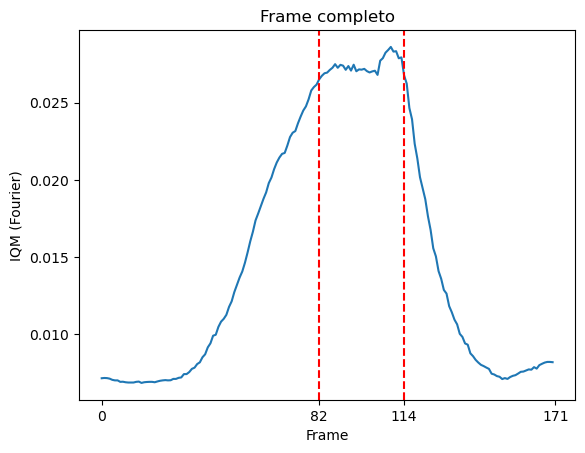

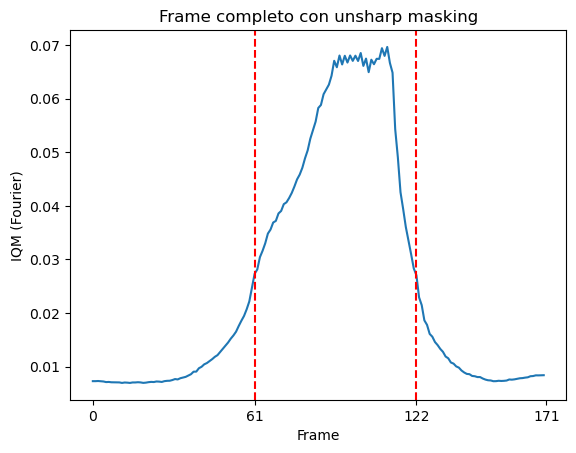

In [8]:
process_video("focus_video.mov", "Frame completo", "Fourier")

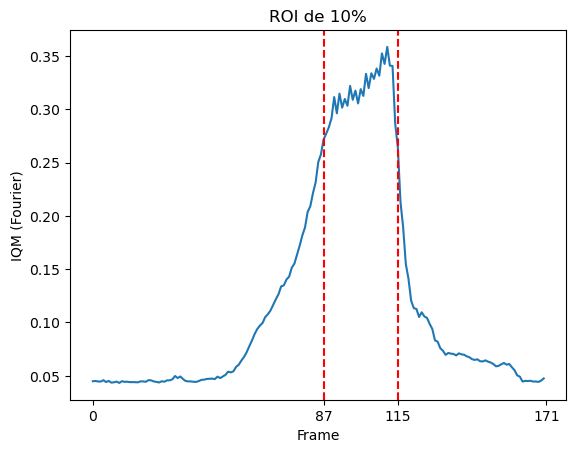

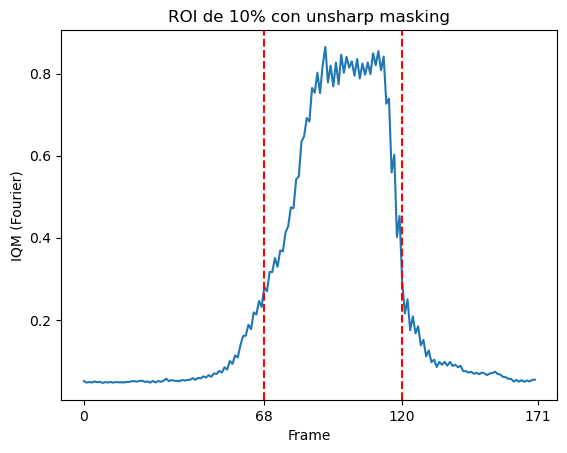

In [9]:
process_video("focus_video.mov", "ROI de 10%", "Fourier", 10)

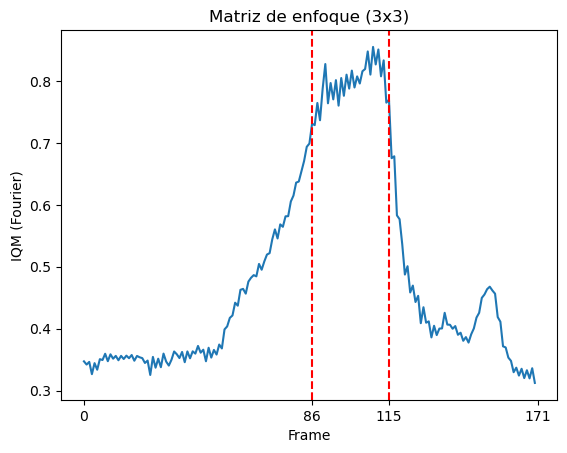

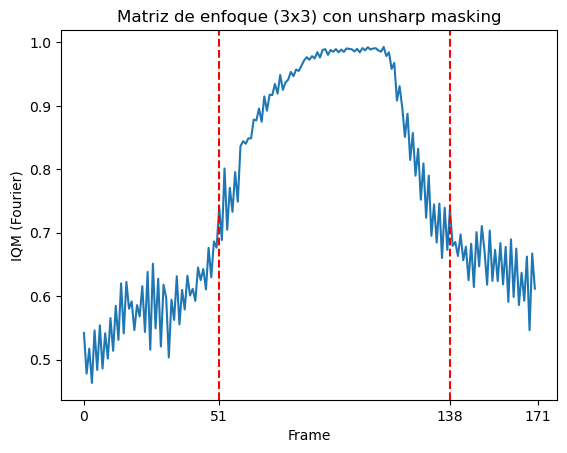

In [10]:
process_video("focus_video.mov", "Matriz de enfoque (3x3)", "Fourier", 10, (3, 3))

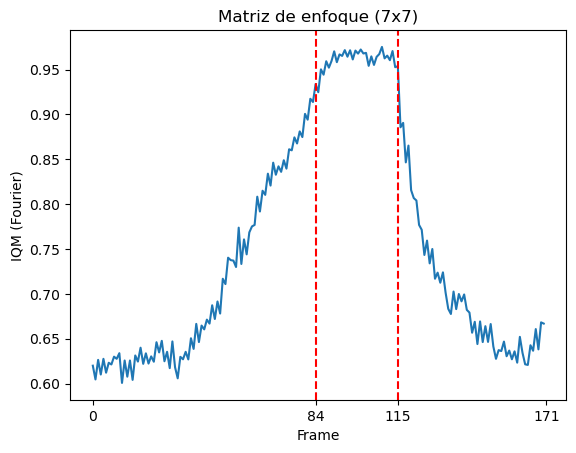

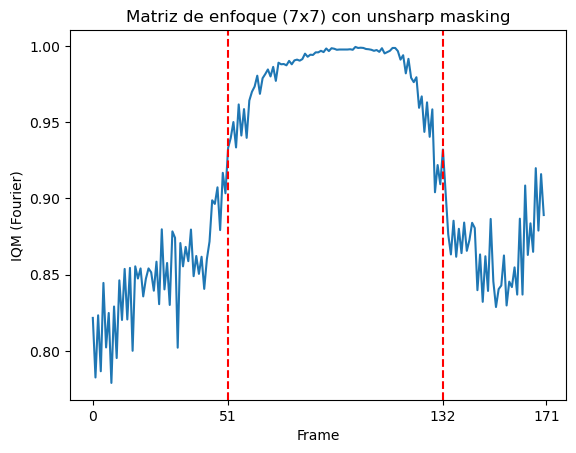

In [11]:
process_video("focus_video.mov", "Matriz de enfoque (7x7)", "Fourier", 10, (7, 7))

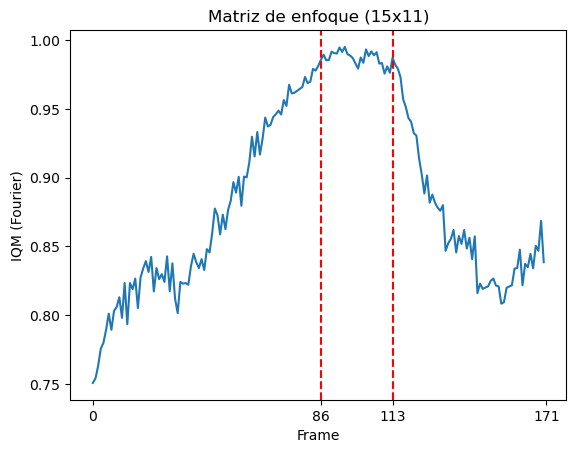

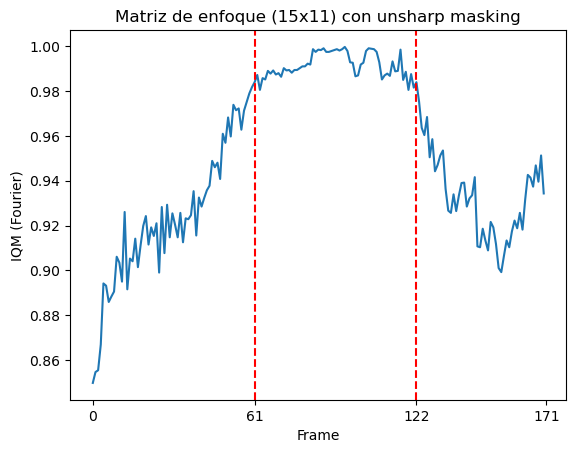

In [12]:
process_video("focus_video.mov", "Matriz de enfoque (15x11)", "Fourier", 10, (15, 11))

## Segunda métrica: Laplaciano diagonal (LAP3)

Esta métrica de enfoque se utiliza para evaluar el nivel de enfoque o nitidez de una imagen, y se basa en la segunda derivada de la imagen. 

Mide cómo cambia la intensidad de los píxeles en todas las direcciones (x e y) y se utiliza para encontrar bordes en una imagen.

Una imagen enfocada tiene muchos bordes bien definidos, mientras que una imagen desenfocada tiende a tener bordes más suaves.

LAP3 detecta bordes no solo en las direcciones horizontales y verticales, sino también en las diagonales, lo que le otorga una mayor capacidad para capturar detalles en todas las direcciones de la imagen.

- Valores altos de LAP3 idican una imagen con muchos bordes bien definidos y, por lo tanto, una imagen más enfocada.

- Valores bajos de LAP3 indican una imagen con menos bordes definidos, por lo tanto, la imagen puede estar desenfocada.

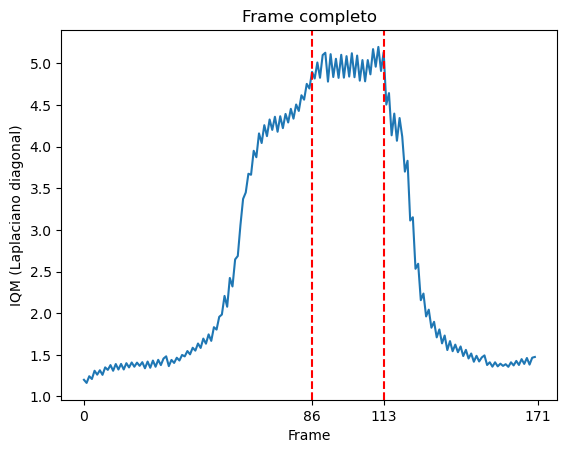

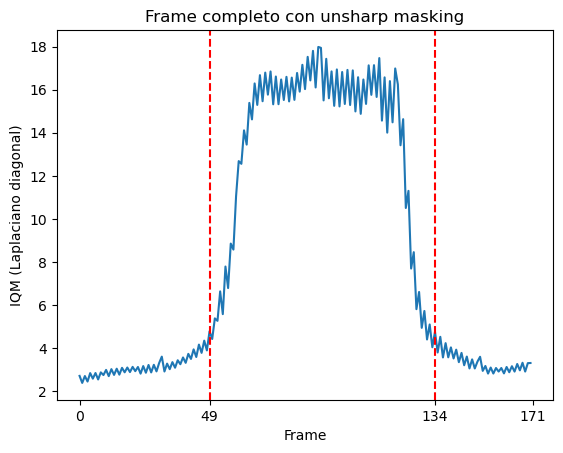

In [13]:
process_video("focus_video.mov", "Frame completo", "Laplaciano diagonal")

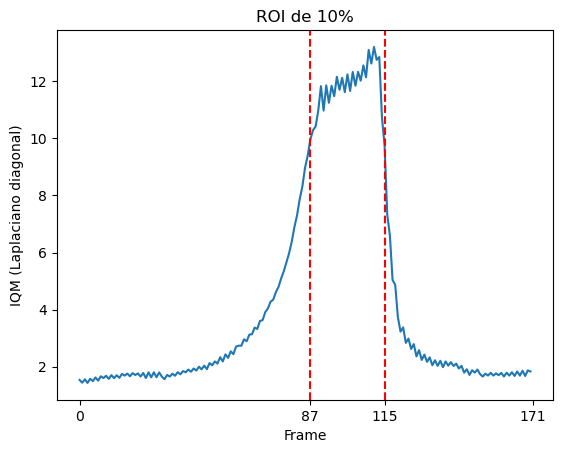

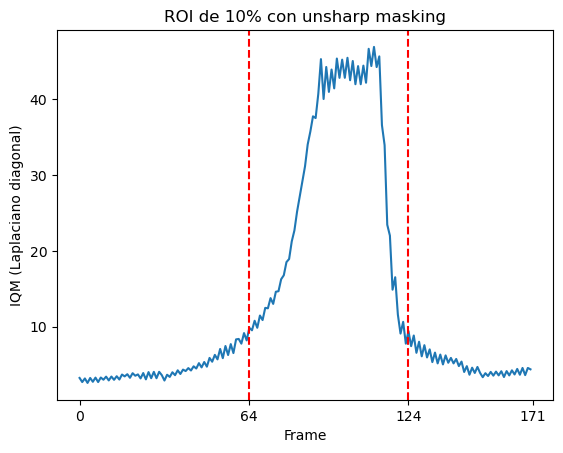

In [14]:
process_video("focus_video.mov", "ROI de 10%", "Laplaciano diagonal", 10)

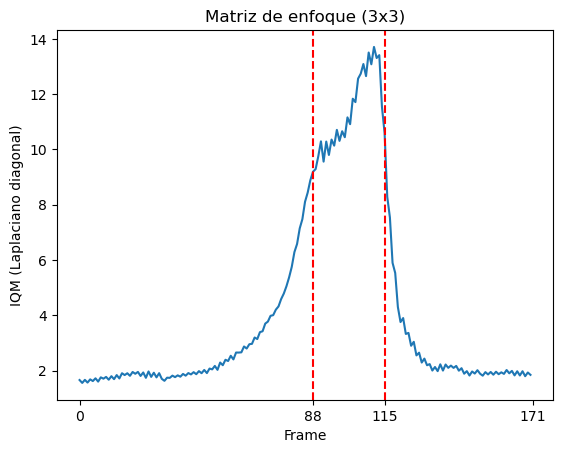

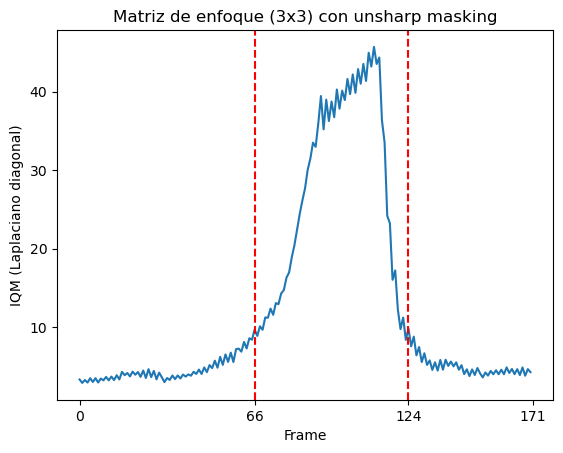

In [15]:
process_video("focus_video.mov", "Matriz de enfoque (3x3)", "Laplaciano diagonal", 10, (3, 3))

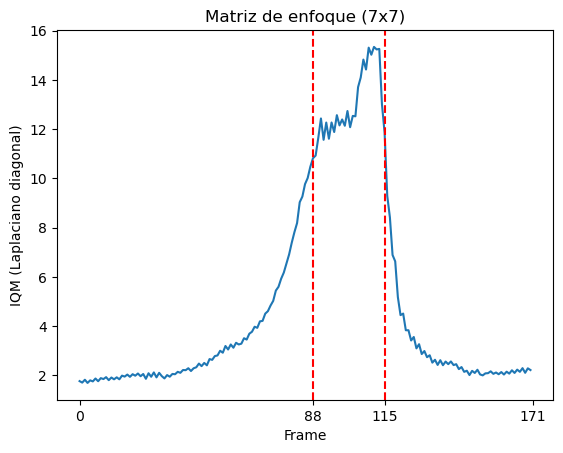

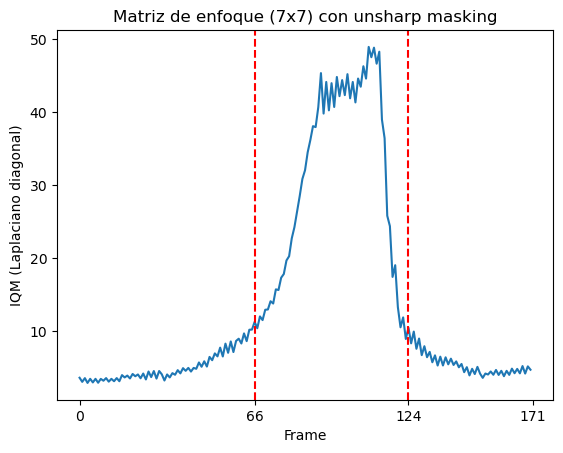

In [16]:
process_video("focus_video.mov", "Matriz de enfoque (7x7)", "Laplaciano diagonal", 10, (7, 7))

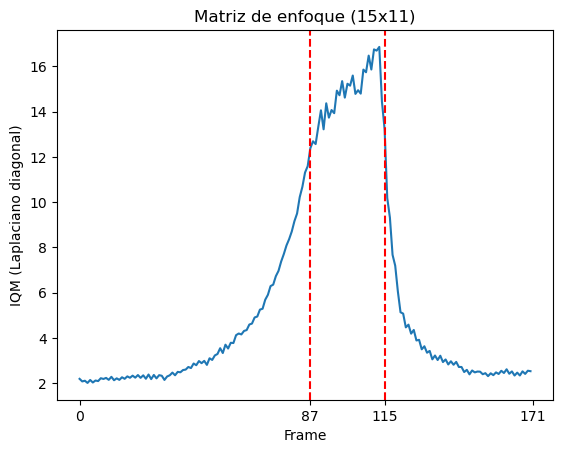

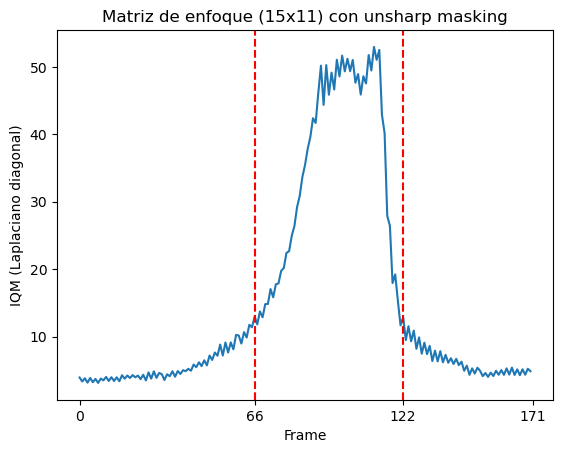

In [17]:
process_video("focus_video.mov", "Matriz de enfoque (15x11)", "Laplaciano diagonal", 10, (15, 11))


### Conclusión 

La métrica Laplaciano Diagonal (LAP3) es más sensible a los bordes y cambios abruptos que la métrica Fourier.
Es decir que se observa que detecta más frames como enfocados.

Esto es más notable después de aplicar "unsharp masking", porque el unsharp masking realza los bordes haciendo que los detalles finos que antes eran sutiles,  y ahora se vuelven identificables para la métrica.
